<a href="https://colab.research.google.com/github/Nas-Z/Image-Colorizor/blob/main/image_colorization_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Contributors** \\
-Anas Aldadi \\
-Abdullah Alaql \\
-Nasser Zorob



#Models' files
you need to download the models and the dataset to try our project


U-Net: https://drive.google.com/file/d/1-7KcOczFI6yPHcL5JvX176a3i9Okbdcq/view?usp=drive_link \\

GAN generator: https://drive.google.com/file/d/13kEDCLA-ml0rT4pypC1b4apCSsnBEBLq/view?usp=sharing

GAN discriminator: https://drive.google.com/file/d/13x0JHyCIMv4UUgdeLnPthx_kbpQN67v_/view?usp=sharing


Diffusion: https://drive.google.com/file/d/18x_iYt3Bz63VIE-XdrczP6zH-UYnkASs/view?usp=sharing

#Dataset's folders

link: https://drive.google.com/file/d/1q4x3-bZY51sr5v1-aI8ZQr1pMO70Opa6/view?usp=sharing

#Libraries and devices

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.17.0


In [ ]:
!pip install -U gdown

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import mixed_precision
from tensorflow.keras.models import Model
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
from google.colab import drive
from PIL import Image
import numpy as np
import os

##Pick a TPU or a GPU

In [ ]:
if Device:=tf.config.list_physical_devices('GPU'):
  print('Using GPU ^_^ !')
  print(f'Details of the GPU {Device}')
elif tf.config.list_physical_devices('GPU'):
  print('No available GPU')
  print(f'Device is CPU')

Using GPU ^_^ !
Details of the GPU [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
!nvidia-smi

Tue Oct  8 08:53:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

##Optionally mount the drive(obligatory for me to save the model)

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
size = (256,256)
max_images= 4000

def load_and_resize_images_from_folder(folder_path, size=(128, 128), max_images=None):
    images = []
    filenames = sorted(os.listdir(folder_path))

    for filename in filenames[0:max_images]:
        img_path = os.path.join(folder_path, filename)
        with Image.open(img_path) as img:
            img = img.resize(size)
            img_array = np.array(img)
            images.append(img_array)

    return np.array(images)

base_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/data'

x_train = load_and_resize_images_from_folder(os.path.join(base_dir, 'train_black'), size=size, max_images=max_images)
y_train = load_and_resize_images_from_folder(os.path.join(base_dir, 'train_color'), size=size, max_images=max_images)
x_test = load_and_resize_images_from_folder(os.path.join(base_dir, 'test_black'), size=size, max_images=int(max_images*.02))
y_test = load_and_resize_images_from_folder(os.path.join(base_dir, 'test_color'), size=size, max_images=int(max_images*.02))

print('x_train shape:', x_train.shape)
print('y_train shape:', y_train.shape)
print('x_test shape:', x_test.shape)
print('y_test shape:', y_test.shape)

x_train shape: (4000, 256, 256, 3)
y_train shape: (4000, 256, 256, 3)
x_test shape: (80, 256, 256, 3)
y_test shape: (80, 256, 256, 3)


In [ ]:
for filename in filenames[0:1]:
          img_path = os.path.join(os.path.join(base_dir, 'train_black'), filename)
          print(img_path)

/content/drive/MyDrive/Colab Notebooks/UQU/AI/data/train_black/ 


array([[[ 25,  35,  33],
        [ 25,  36,  32],
        [ 25,  36,  29],
        ...,
        [ 65,  93,  52],
        [ 65,  93,  52],
        [ 65,  93,  52]],

       [[ 26,  35,  33],
        [ 26,  35,  32],
        [ 26,  35,  29],
        ...,
        [ 65,  93,  52],
        [ 66,  94,  53],
        [ 66,  94,  53]],

       [[ 28,  34,  33],
        [ 28,  34,  32],
        [ 28,  34,  29],
        ...,
        [ 65,  93,  52],
        [ 66,  94,  53],
        [ 66,  94,  53]],

       ...,

       [[176, 178, 177],
        [176, 178, 177],
        [176, 178, 177],
        ...,
        [183, 189, 189],
        [183, 189, 189],
        [183, 189, 189]],

       [[176, 178, 177],
        [176, 178, 177],
        [176, 178, 177],
        ...,
        [183, 189, 189],
        [183, 189, 189],
        [183, 189, 189]],

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [183, 189, 189],
        [183, 189, 189],
        [183, 189, 189]]], dtype=uint8)
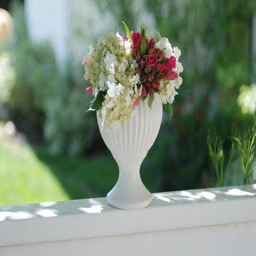

In [ ]:
y_train[2, :, :, :]

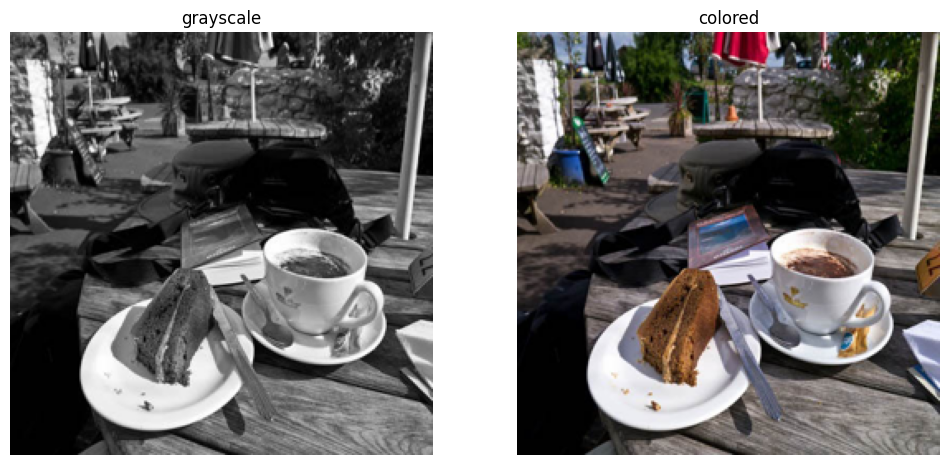

In [ ]:
index = 22
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(x_train[index])
axes[0].set_title('grayscale')
axes[0].axis('off')

axes[1].imshow(y_train[index])
axes[1].set_title('colored')
axes[1].axis('off')

plt.show()

#Preprocess the dataset

##Full pipeline

We defined the pipeline to unify the size of input images, and normalize them

In [ ]:
def create_pipeline(x, label, height=32, width=32, batch_size=32, buffer_size=1000):

  #helper function
  def resize_image(image, height=32, width=32):
    return tf.image.resize(image, [height, width])

  def normalize_image(image):
    return image/255.

  def preprocess_image(image, label):
    image = resize_image(image, height, width)
    label = resize_image(label, height, width)
    image = normalize_image(image)
    label = normalize_image(label)
    return image, label

  dataset = tf.data.Dataset.from_tensor_slices((x, label))

  preprocessed_dataset = (
      dataset
      .map(lambda img, lbl: preprocess_image(img, lbl),
           num_parallel_calls=tf.data.AUTOTUNE)
      .shuffle(buffer_size) #shuffle every buffer_size number of images
      .batch(batch_size) #slice the dataset into batches
      .prefetch(tf.data.AUTOTUNE) #overlap the process for better performance
  )

  return preprocessed_dataset

In [ ]:
img_size = 256
processed_train = create_pipeline(x_train, y_train, height=img_size, width=img_size)
processed_test = create_pipeline(x_test, y_test, height=img_size, width=img_size)

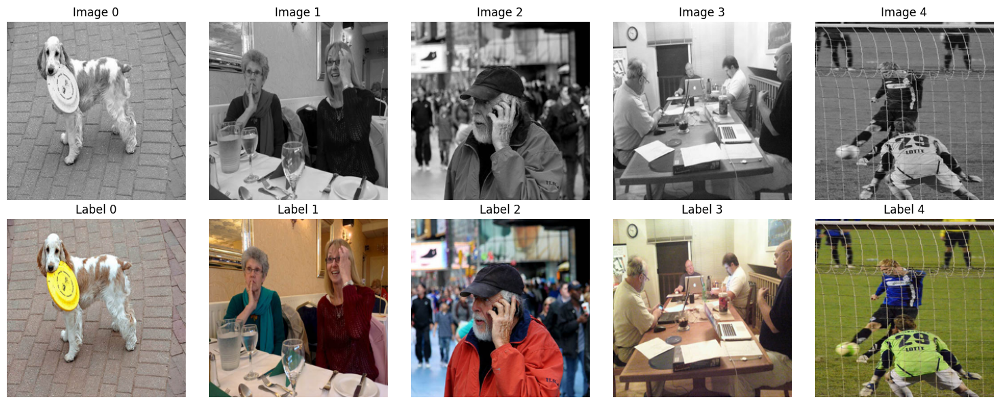

In [ ]:
def plot_images_and_labels(images, labels, num_samples=5):
    plt.figure(figsize=(15, 6))

    for i in range(num_samples):
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(images[i].numpy(), cmap='gray')
        plt.title(f'Image {i}')
        plt.axis('off')

    for i in range(num_samples):
        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.imshow(labels[i].numpy(), cmap='gray')
        plt.title(f'Label {i}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

for images, labels in processed_train.take(1):
    plot_images_and_labels(images, labels, num_samples=5)
    break

Images shape: (32, 256, 256, 3)


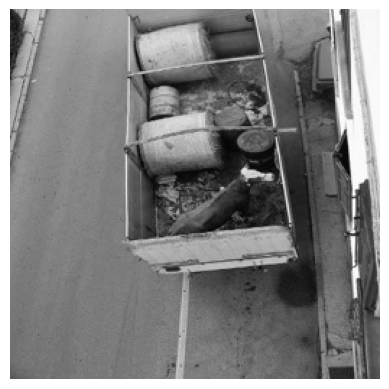

In [ ]:
for images, label in processed_train.as_numpy_iterator():
    print(f'Images shape: {images.shape}')
    plt.imshow(images[0], cmap='gray')
    plt.axis('off')
    plt.show()
    break

#Model UNet

A U-Net that takes 32 by 32 by 1 images and output the shape 32,32,3

##Selected archeticture

In [ ]:
def smaller_unet_model(input_shape, n_filters=32):
    kernel_initializer = tf.keras.initializers.HeNormal()

    inputs = tf.keras.layers.Input(shape=input_shape)

    #encoder
    conv1 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(inputs) #(256,256,32)
    conv1 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv1) #(256,256,32)
    pool1 = tf.keras.layers.MaxPooling2D((2, 2))(conv1) #(128,128,32)

    conv2 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(pool1)  #(128,128,64)
    conv2 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv2)
    pool2 = tf.keras.layers.MaxPooling2D((2, 2))(conv2) # (64,64,64)

    #bottleneck
    conv3 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(pool2)
    conv3 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv3)

    #decoder
    up4 = tf.keras.layers.Conv2DTranspose(2*n_filters, (2, 2), strides=(2, 2), padding='same')(conv3) # (128,128,64)
    concat4 = tf.keras.layers.Concatenate()([up4, conv2])
    conv4 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(concat4)
    conv4 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv4)

    up5 = tf.keras.layers.Conv2DTranspose(n_filters, (2, 2), strides=(2, 2), padding='same')(conv4) # (256,256,32)
    concat5 = tf.keras.layers.Concatenate()([up5, conv1])
    conv5 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(concat5)
    conv5 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv5)

    outputs = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid', padding='same')(conv5)  #output RGB image (256,256,3)

    model = tf.keras.models.Model(inputs=[inputs], outputs=[outputs])

    return model

In [ ]:
img_size = 256
input_shape = (img_size, img_size, 3)
model = smaller_unet_model(input_shape)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 256, 256, 32)   │            896 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 256, 256, 32)   │          9,248 │ conv2d_11[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 128, 128, 32)   │              0 │ conv2d_12[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 128, 128, 64)   │         18,496 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 128, 128, 64)   │         36,928 │ conv2d_13[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 64, 64, 64)     │              0 │ conv2d_14[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_15 (Conv2D)        │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 64, 64, 128)    │        147,584 │ conv2d_15[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_2        │ (None, 128, 128, 64)   │         32,832 │ conv2d_16[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 128, 128, 128)  │              0 │ conv2d_transpose_2[0]… │
│ (Concatenate)             │                        │                │ conv2d_14[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_17 (Conv2D)        │ (None, 128, 128, 64)   │         73,792 │ concatenate_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_18 (Conv2D)        │ (None, 128, 128, 64)   │         36,928 │ conv2d_17[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_3        │ (None, 256, 256, 32)   │          8,224 │ conv2d_18[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 256, 256, 64)   │              0 │ conv2d_transpose_3[0]… │
│ (Concatenate)             │                        │                │ conv2d_12[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)        │ (None, 256, 256, 32)   │         18,464 │ concatenate_3[0][0]    │
├──────────────────────

 Total params: 466,595 (1.78 MB)

 Trainable params: 466,595 (1.78 MB)

 Non-trainable params: 0 (0.00 B)

###Training

####Hyperparameters

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
epochs = 1
loss= tf.keras.losses.MeanSquaredError()

In [ ]:
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

####initalize checkpointing settings

In [ ]:
model_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/colorization_UNet.h5'
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/model_checkpoint.weights.h5'
epoch_save_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/last_epoch.txt'

In [ ]:
class EpochSaver(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        with open(epoch_save_path, 'w') as f:
            f.write(str(epoch + 1))

In [ ]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_best_only=True,
    verbose=1
)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
)


####Training

In [ ]:
history = model.fit(
    processed_train,
    epochs=epochs,
    validation_data=processed_test,
    callbacks=[checkpoint_callback, early_stopping_callback, EpochSaver()],
    verbose=1
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.4882 - loss: 0.0192

In [ ]:
model.save(model_path)

###further training

train from the last epoch

load the model and weights if there are previous training

In [ ]:
model_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/colorization_UNet.h5'
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/model_checkpoint.weights.h5'
epoch_save_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/last_epoch.txt'

In [ ]:
class EpochSaver(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        with open(epoch_save_path, 'w') as f:
            f.write(str(epoch + 1))

In [ ]:
if os.path.exists(epoch_save_path):
    with open(epoch_save_path, 'r') as f:
        last_epoch = int(f.read())
else:
    last_epoch = 0

print(f"Resuming training from epoch {last_epoch}")

model = tf.keras.models.load_model(model_path)
model.load_weights(checkpoint_path)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
loss = tf.keras.losses.MeanSquaredError()
epochs=100
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_best_only=True,
    verbose=1
)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

Resuming training from epoch 71


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 54 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
#resume training from the last saved epoch
history = model.fit(
    processed_train,
    epochs=epochs,
    validation_data=processed_test,
    initial_epoch=last_epoch,
    callbacks=[checkpoint_callback, early_stopping_callback, EpochSaver()]  #save weights, early stopping, epoch tracking
)

Epoch 68/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.5363 - loss: 0.0067
Epoch 68: val_loss improved from inf to 0.00574, saving model to /content/drive/MyDrive/Colab Notebooks/UQU/AI/model_checkpoint.weights.h5
125/125 ━━━━━━━━━━━━━━━━━━━━ 109s 563ms/step - accuracy: 0.5364 - loss: 0.0067 - val_accuracy: 0.5206 - val_loss: 0.0057
Epoch 69/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.5380 - loss: 0.0065
Epoch 69: val_loss improved from 0.00574 to 0.00571, saving model to /content/drive/MyDrive/Colab Notebooks/UQU/AI/model_checkpoint.weights.h5
125/125 ━━━━━━━━━━━━━━━━━━━━ 88s 399ms/step - accuracy: 0.5380 - loss: 0.0065 - val_accuracy: 0.5449 - val_loss: 0.0057
Epoch 70/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.5419 - loss: 0.0064
Epoch 70: val_loss improved from 0.00571 to 0.00564, saving model to /content/drive/MyDrive/Colab Notebooks/UQU/AI/model_checkpoint.weights.h5
125/125 ━━━━━━━━━━━━━━━━━━━━ 51s 398ms/step - accuracy: 0.5419 -

###Save the model only if it performed better

In [ ]:
model.save(model_path)

##Inference

Extract an image

In [ ]:
image_index=0
for test_batch, label_batch in processed_train.take(1):
    test_image = test_batch[image_index]
    label_image = label_batch[image_index]

test_image = tf.expand_dims(test_image, axis=0)
label_image = tf.expand_dims(label_image, axis=0)

In [ ]:
new_model = tf.keras.models.load_model(model_path)

predict colors

In [ ]:
colorized_image = new_model.predict(test_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


##Visualization of the output

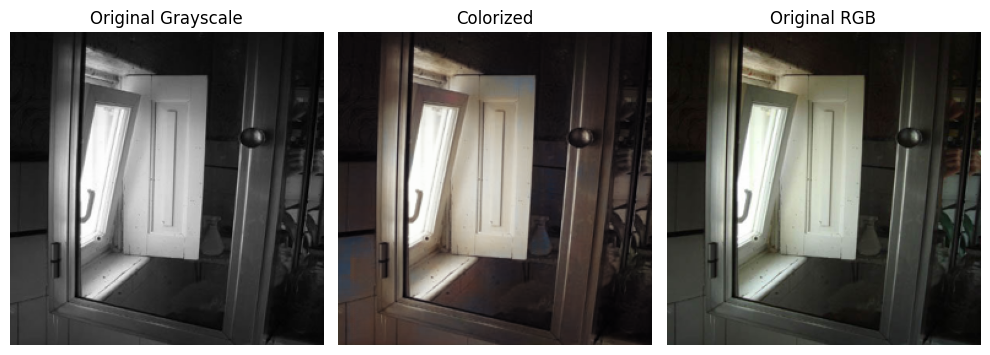

In [ ]:
colorized_image_rescaled = colorized_image[0]

grayscale_test_image_rescaled = (test_image[0] * 255).numpy().astype('uint8').squeeze()

grayscale_label_image_rescaled = (label_image[0] * 255).numpy().astype('uint8').squeeze()

plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(grayscale_test_image_rescaled, cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(colorized_image_rescaled)
plt.title("Colorized")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(grayscale_label_image_rescaled)
plt.title("Original RGB")
plt.axis('off')

plt.tight_layout()
plt.show()

##Visualization of the hidden layers activations

In [ ]:
for layer in model.layers:
    print(layer.name)

input_layer_1
conv2d_19
conv2d_20
max_pooling2d_4
conv2d_21
conv2d_22
max_pooling2d_5
conv2d_23
conv2d_24
conv2d_transpose_4
concatenate_4
conv2d_25
conv2d_26
conv2d_transpose_5
concatenate_5
conv2d_27
conv2d_28
conv2d_29


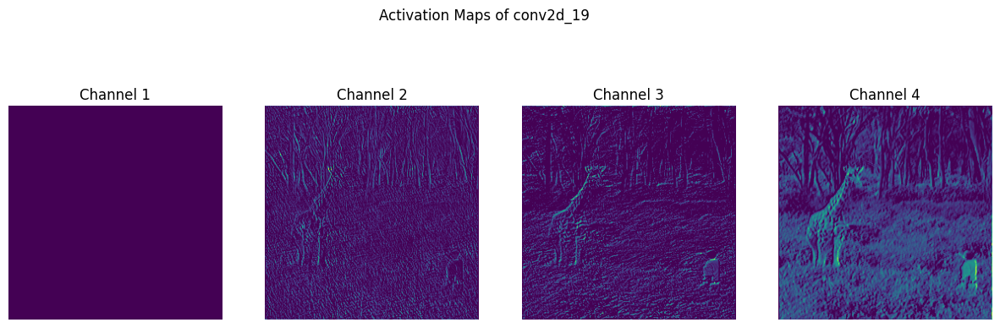

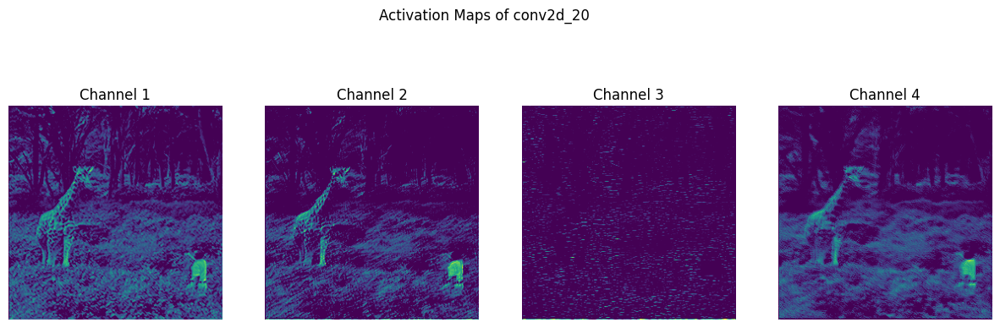

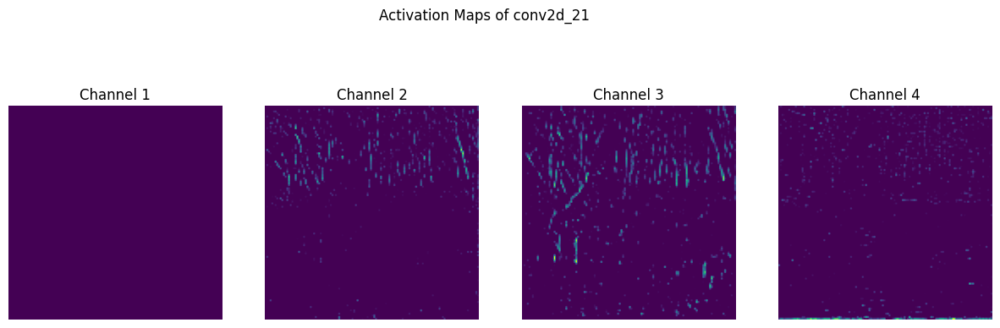

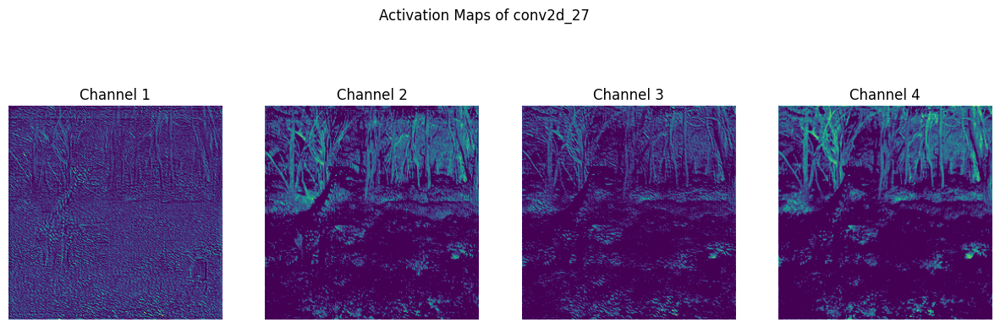

In [ ]:
layer_names = ['conv2d_19', 'conv2d_20', 'conv2d_21', 'conv2d_27']
layers = [model.get_layer(layer_name).output for layer_name in layer_names]

activation_model = tf.keras.models.Model(inputs=model.input, outputs=layers)

input_image = test_image

activations = activation_model(input_image)

def display_activation_maps(activation, layer_name, num_channels=4):
    activation = tf.squeeze(activation, 0)

    fig, axes = plt.subplots(1, num_channels, figsize=(15, 5))
    fig.suptitle(f'Activation Maps of {layer_name}')

    for i in range(num_channels):
        axes[i].imshow(activation[:, :, i], cmap='viridis')
        axes[i].axis('off')
        axes[i].set_title(f'Channel {i+1}')

    plt.show()

for i, layer_name in enumerate(layer_names):
    display_activation_maps(activations[i], layer_name)


#Model GAN (Generative adversarial network)

###1 sampled image to test

In [ ]:
index = 1000
size = (256,256)
base_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/data'

def load_img(folder_path, size=(128, 128), index=1000):
  filenames = sorted(os.listdir(folder_path))

  images = []
  for filename in filenames[index:index+1]:
            img_path = os.path.join(folder_path, filename)
            with Image.open(img_path) as img:
                img = img.resize(size)
                img_array = np.array(img)
                images.append(img_array)
  return np.array(images)

input_img = load_img(os.path.join(base_dir, 'train_black'), size=size, index=index)
re_img = load_img(os.path.join(base_dir, 'train_color'), size=size, index=index)

In [ ]:
processed_testing_img = create_pipeline(input_img, input_img, height=size[0], width=size[1])

(-0.5, 255.5, 255.5, -0.5)

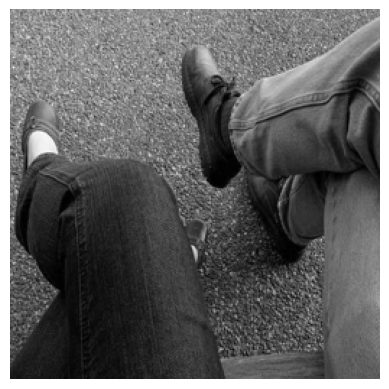

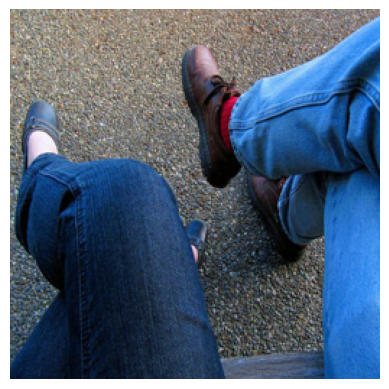

In [ ]:
plt.figure()
plt.imshow(input_img[0] / 255.)
plt.axis('off')
plt.figure()
plt.imshow(re_img[0] / 255.)
plt.axis('off')

##Build the generator as U-Net

###Encoder

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(input_img[0], 0))
print (down_result.shape)

(1, 128, 128, 3)


###Decoder

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

###The generator U-Net

In [ ]:
def Generator():
  output_channels = 3
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(output_channels, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

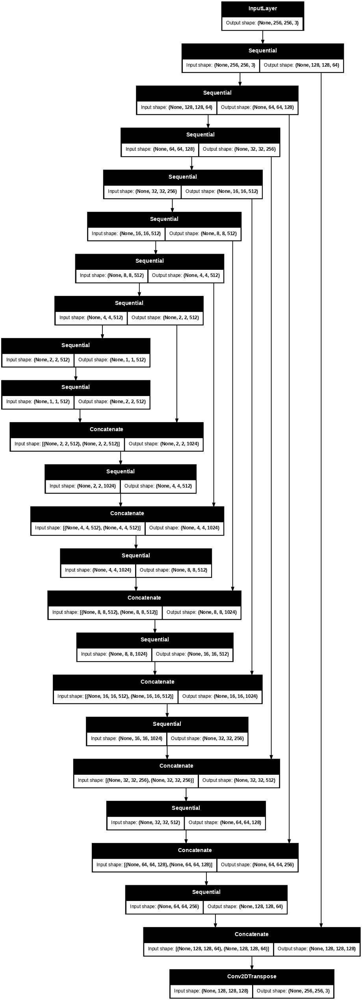

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
for example_input, example_target in processed_testing_img.take(1):
  inp=example_input

(-0.5, 255.5, 255.5, -0.5)

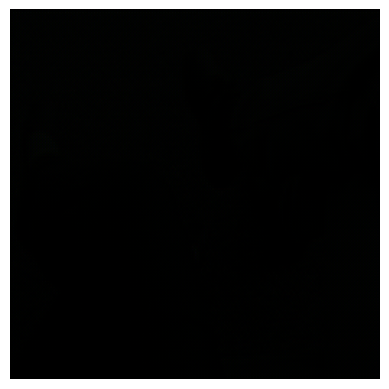

In [ ]:
gen_output = generator(inp[0][tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])
plt.axis('off')

In [ ]:
print(type(gen_output))

<class 'tensorflow.python.framework.ops.EagerTensor'>


In [ ]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

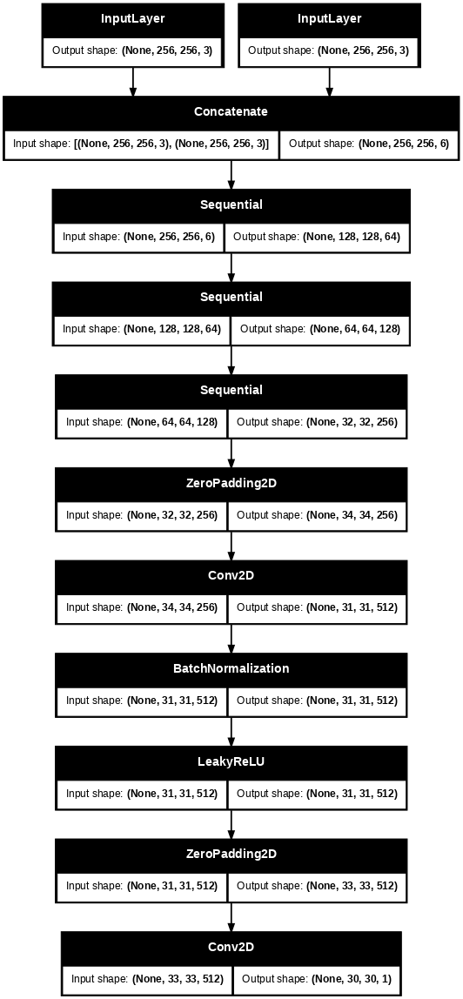

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

SETTING UP THE GENERATOR CHECKPOINTING

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

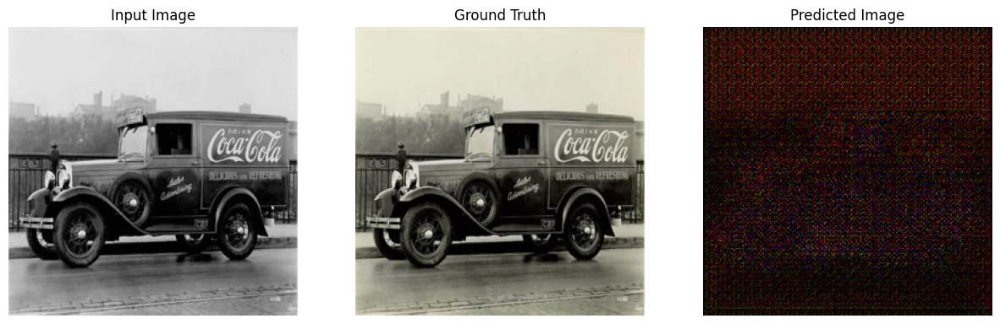

In [ ]:
new_img_wow=[]
for example_input, example_target in processed_test.take(1):
  new_img_wow=example_input
  generate_images(generator, example_input, example_target)

In [ ]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def gan_train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
from IPython.display import clear_output
import time

def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      clear_output(wait=True)  # Use clear_output from IPython

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    gan_train_step(input_image, target, step)

    #raining step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    #checkpointing! the model every 1k steps
    if (step + 1) % 1000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)
      print(f"Checkpoint saved at step {step+1}")


SETTING UP THE DISCRIMINATOR CHECKPOINTING

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/GAN_Models'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt-27")

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
generator = tf.keras.models.load_model('/content/generator_model3.h5')
discriminator = tf.keras.models.load_model('/content/discriminator_model3.h5')

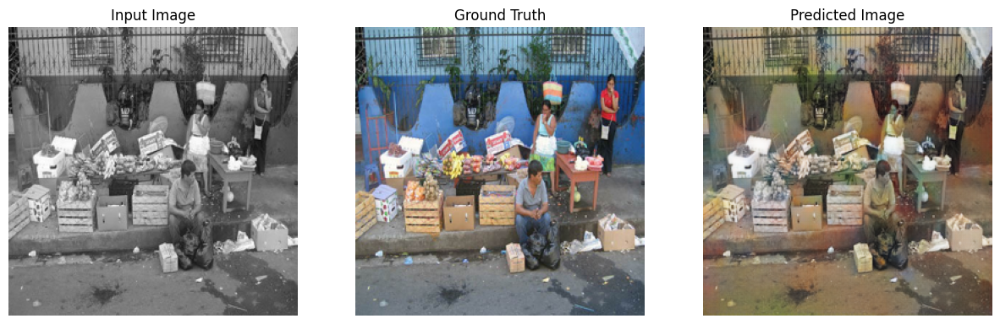

Step: 24k
....................................................................................................Checkpoint saved at step 25000


In [ ]:
fit(processed_train, processed_test, steps=25000)

In [ ]:
checkpoint.save(file_prefix=checkpoint_prefix)

'/content/drive/MyDrive/Colab Notebooks/UQU/AI/GAN_Models/ckpt-36'

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_prefix))

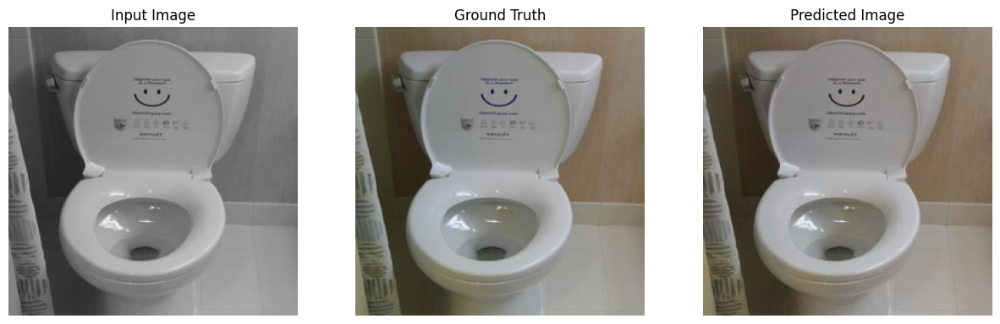

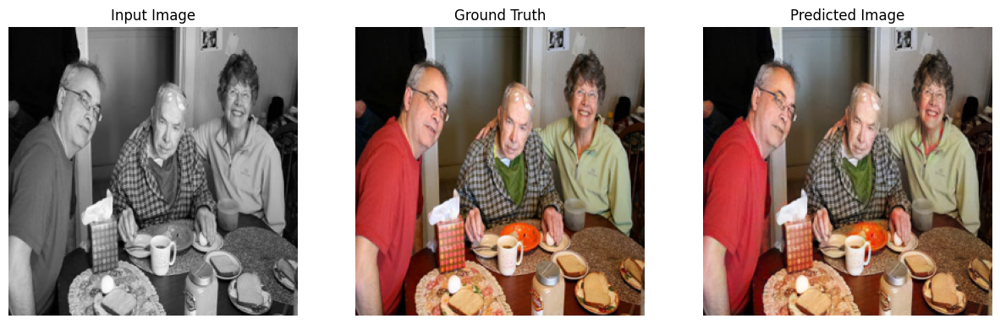

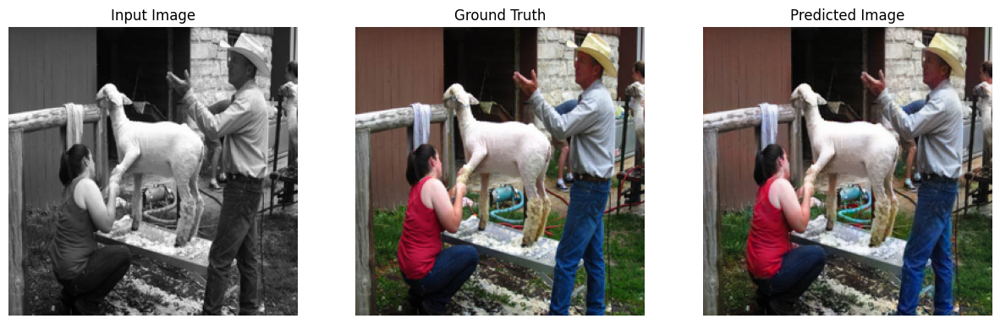

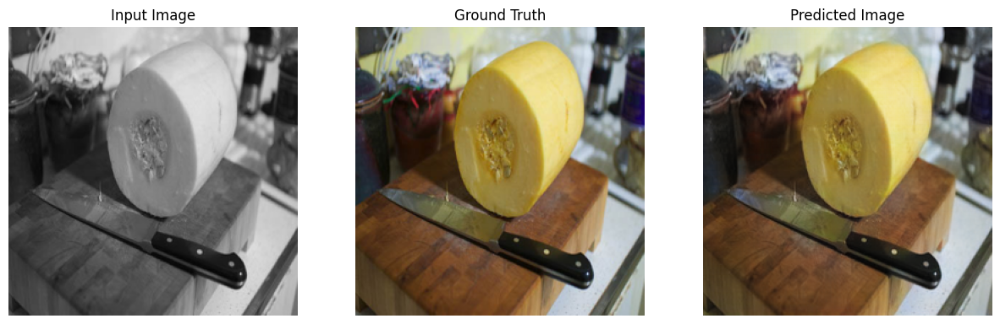

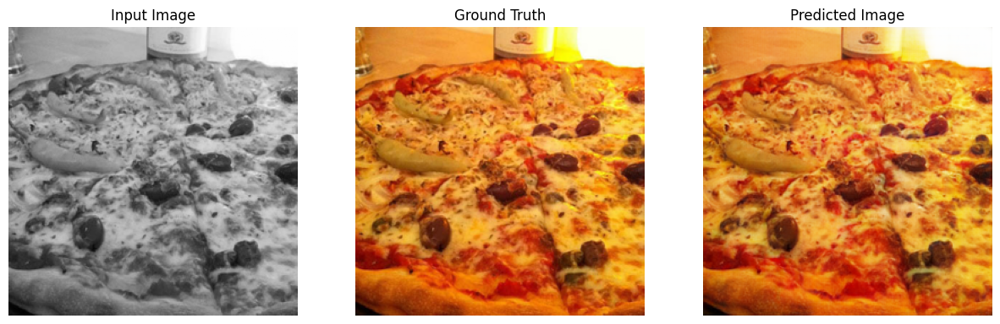

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in processed_test.take(5):
  generate_images(generator, inp, tar)

In [ ]:
image_index=2
for test_batch, label_batch in processed_train.take(1):
    test_image = test_batch[image_index]
    label_image = label_batch[image_index]
test_image = tf.expand_dims(test_image, axis=0)
label_image = tf.expand_dims(label_image, axis=0)

In [ ]:
colorized_image = generator(test_image, training=True)

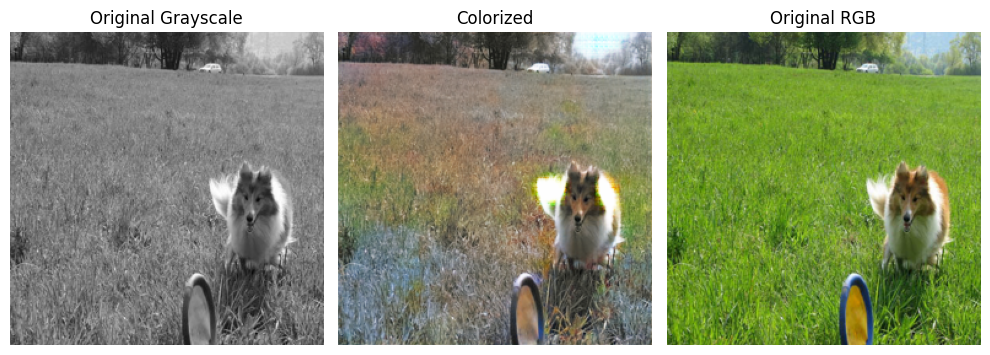

In [ ]:
colorized_image_rescaled = colorized_image[0]
grayscale_test_image_rescaled = (test_image[0] * 255).numpy().astype('uint8').squeeze()

grayscale_label_image_rescaled = (label_image[0] * 255).numpy().astype('uint8').squeeze()

plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(grayscale_test_image_rescaled, cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(colorized_image[0])
plt.title("Colorized")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(grayscale_label_image_rescaled)
plt.title("Original RGB")
plt.axis('off')

plt.tight_layout()
plt.show()

#Denoising Diffusion Probabilistic Model (DDPM)

new preprocessing pipeline for diffusion

In [ ]:
def diff_create_pipeline(x, label, timesteps, height=256, width=256, batch_size=32, buffer_size=1000):

    def resize_image(image, height, width):
        return tf.image.resize(image, [height, width])

    def normalize_image(image):
        return image / 255.0

    def preprocess_image(image, label):
        image = resize_image(image, height, width)
        label = resize_image(label, height, width)
        image = normalize_image(image)
        label = normalize_image(label)
        return image, label

    def add_time_step(image, label):
        time_step = np.random.randint(0, timesteps)
        return (image, time_step), label

    dataset = tf.data.Dataset.from_tensor_slices((x, label))

    preprocessed_dataset = (
        dataset
        .map(lambda img, lbl: preprocess_image(img, lbl), num_parallel_calls=tf.data.AUTOTUNE)
        .map(add_time_step, num_parallel_calls=tf.data.AUTOTUNE)
        .shuffle(buffer_size)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )

    return preprocessed_dataset

In [ ]:
timesteps = 1000
img_size = 256
batch_size = 32
diff_processed_train = diff_create_pipeline(x_train, y_train, timesteps, height=img_size, width=img_size, batch_size=batch_size)
diff_processed_test = diff_create_pipeline(x_test, y_test, timesteps, height=img_size, width=img_size, batch_size=batch_size)

1. Noise Schedule

In [ ]:
def linear_beta_schedule(timesteps, start=1e-4, end=0.02):
    return tf.linspace(start, end, timesteps)

2. Forward Diffusion Process

In [ ]:
def forward_diffusion(x, t, noise):

    sqrt_alpha_t = tf.sqrt(1.0 - beta[t])
    sqrt_one_minus_alpha_t = tf.sqrt(beta[t])
    return sqrt_alpha_t * x + sqrt_one_minus_alpha_t * noise

3. Reverse Process (UNet Backbone)

In [ ]:
def ddpm_unet(input_shape=(256, 256, 3), timesteps=1000, n_filters=64):

    image_input = tf.keras.layers.Input(shape=input_shape, name='image_input')

    time_input = tf.keras.layers.Input(shape=(1,), name='time_input')

    time_embedding = tf.keras.layers.Embedding(input_dim=timesteps, output_dim=32)(time_input)
    time_embedding = tf.keras.layers.Dense(32, activation='relu')(time_embedding)
    time_embedding = tf.keras.layers.Reshape((1, 1, 32))(time_embedding)

    time_embedding_broadcast = tf.keras.layers.Conv2D(128, (1, 1), padding='same')(time_embedding)

    kernel_initializer = 'he_normal'

    conv1 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(image_input)
    conv1 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv1)
    pool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(pool1)
    conv2 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv2)
    pool2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(pool2)
    conv3 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv3)
    pool3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    bottleneck = tf.keras.layers.Conv2D(8*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(pool3)
    bottleneck = tf.keras.layers.Conv2D(8*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(bottleneck)

    up4 = tf.keras.layers.Conv2DTranspose(4*n_filters, (2, 2), strides=(2, 2), padding='same')(bottleneck)
    concat4 = tf.keras.layers.Concatenate()([up4, conv3])
    conv4 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(concat4)
    conv4 = tf.keras.layers.Conv2D(4*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv4)

    up5 = tf.keras.layers.Conv2DTranspose(2*n_filters, (2, 2), strides=(2, 2), padding='same')(conv4)

    time_embedding_broadcast = tf.keras.layers.UpSampling2D(size=(up5.shape[1] // time_embedding.shape[1], up5.shape[2] // time_embedding.shape[2]))(time_embedding)

    concat5 = tf.keras.layers.Concatenate()([up5, conv2, time_embedding_broadcast])
    conv5 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(concat5)
    conv5 = tf.keras.layers.Conv2D(2*n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv5)

    up6 = tf.keras.layers.Conv2DTranspose(n_filters, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = tf.keras.layers.Concatenate()([up6, conv1])
    conv6 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(concat6)
    conv6 = tf.keras.layers.Conv2D(n_filters, (3, 3), activation='relu', padding='same', kernel_initializer=kernel_initializer)(conv6)

    output = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid', padding='same')(conv6)

    model = tf.keras.Model(inputs=[image_input, time_input], outputs=output)

    return model

In [ ]:
diff = ddpm_unet()
diff.summary()

Model: "functional_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ conv2d_30[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ conv2d_31[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ conv2d_32[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ conv2d_33[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_34[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 256)    │              0 │ conv2d_35[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_36 (Conv2D)        │ (None, 32, 32, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_37 (Conv2D)        │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_36[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_8        │ (None, 64, 64, 256)    │        524,544 │ conv2d_37[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_input (InputLayer)   │ (None, 1)              │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_11            │ (None, 64, 64, 512)    │              0 │ conv2d_transpose_8[0]… │
│ (Concatenate)             │                        │                │ conv2d_35[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 1, 32)          │         32,000 │ time_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_38 (Conv2D)        │ (None, 64, 64, 256)    │      1,179,904 │ concatenate_11[0][0]   │
├──────────────────────

 Total params: 7,767,395 (29.63 MB)

 Trainable params: 7,767,395 (29.63 MB)

 Non-trainable params: 0 (0.00 B)

4. Training the DDPM

In [ ]:
def ddpm_loss(noise, predicted_noise):
    return tf.reduce_mean(tf.square(noise - predicted_noise))

def train_step(model, x, t, optimizer):
    with tf.GradientTape() as tape:
        noise = tf.random.normal(shape=x.shape)
        noisy_image = forward_diffusion(x, t, noise)
        predicted_noise = model([noisy_image, t], training=True)
        loss = ddpm_loss(noise, predicted_noise)

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return loss

5. Sample Images from the Model

In [ ]:
def reverse_diffusion(img, pred_noise, t, beta_t_schedule):

    beta_t = beta_t_schedule[t]
    alpha_t = 1.0 - beta_t

    mean = (img - beta_t * pred_noise) / tf.sqrt(alpha_t)

    if t > 0:
        noise = tf.random.normal(img.shape)
        std_dev = tf.sqrt(beta_t)
        img = mean + std_dev * noise
    else:
        img = mean

    return img

In [ ]:
def get_beta_schedule(timesteps, start=1e-4, end=0.02):
    return tf.linspace(start, end, timesteps)

In [ ]:
def sample_ddpm(model, shape, timesteps=1000):
    img = tf.random.normal(shape)
    beta_schedule = get_beta_schedule(timesteps)

    for t in reversed(range(timesteps)):
        pred_noise = model([img, tf.constant([[t]])])
        img = reverse_diffusion(img, pred_noise, t, beta_schedule)

    return img

6. Deployment

In [ ]:
diffusion_model_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/Diffusion_UNet.h5'
checkpoint_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/model_checkpoint.weights.h5'
epoch_save_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/last_epoch.txt'

In [ ]:
diffusion_model = ddpm_unet(input_shape=(img_size, img_size, 3))

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
loss_fn = ddpm_loss

In [ ]:
diffusion_model.compile(optimizer=optimizer, loss=loss_fn)

In [ ]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_best_only=True,
    monitor='val_loss',
    verbose=1
)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
)

class EpochSaver(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        with open(epoch_save_path, 'w') as f:
            f.write(str(epoch + 1))

Training

In [ ]:
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

epochs=27

history = diffusion_model.fit(
    diff_processed_train,
    validation_data=diff_processed_test,
    epochs=epochs,
    callbacks=[checkpoint_callback, early_stopping_callback, EpochSaver()]
)


Epoch 1/27
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.0092
Epoch 1: val_loss did not improve from 0.03591
125/125 ━━━━━━━━━━━━━━━━━━━━ 157s 1s/step - loss: 0.0092 - val_loss: 0.0637
Epoch 2/27
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.0081
Epoch 2: val_loss did not improve from 0.03591
125/125 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - loss: 0.0081 - val_loss: 0.0719


In [ ]:
class CustomCheckpoint(tf.keras.callbacks.Callback):
    def __init__(self, save_freq_epochs, checkpoint_path):
        super().__init__()
        self.save_freq_epochs = save_freq_epochs
        self.checkpoint_path = checkpoint_path

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.save_freq_epochs == 0:
            self.model.save_weights(self.checkpoint_path)
            print(f"\nModel checkpoint saved at epoch {epoch + 1}")

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
)

class EpochSaver(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        with open(epoch_save_path, 'w') as f:
            f.write(str(epoch + 1))

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

epochs = 121

custom_checkpoint_callback = CustomCheckpoint(save_freq_epochs=5, checkpoint_path=checkpoint_path)

In [ ]:
history = diffusion_model.fit(
    diff_processed_train,
    validation_data=diff_processed_test,
    epochs=11,
    callbacks=[custom_checkpoint_callback, early_stopping_callback, EpochSaver()]
)

Epoch 1/11
125/125 ━━━━━━━━━━━━━━━━━━━━ 721s 927ms/step - loss: 0.0181 - val_loss: 0.0100
Epoch 2/11
125/125 ━━━━━━━━━━━━━━━━━━━━ 55s 429ms/step - loss: 0.0090 - val_loss: 0.0082
Epoch 3/11
125/125 ━━━━━━━━━━━━━━━━━━━━ 85s 436ms/step - loss: 0.0081 - val_loss: 0.0107
Epoch 4/11
125/125 ━━━━━━━━━━━━━━━━━━━━ 55s 428ms/step - loss: 0.0080 - val_loss: 0.0102


#Inference

loading diffusion is different


In [ ]:
custom_objects = {
    'ddpm_loss': ddpm_loss,
    'reverse_diffusion': reverse_diffusion
}

trained_diffusion_model = tf.keras.models.load_model(
    '/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/Diffusion_UNet.h5',
    custom_objects=custom_objects
)

OR use this

In [ ]:
trained_model = ddpm_unet(input_shape=(img_size, img_size, 3), timesteps=1000)

In [ ]:
trained_model.load_weights(checkpoint_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 53s 53s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 59s 59s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 65s 65s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 49s 49s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 47s 47s/step


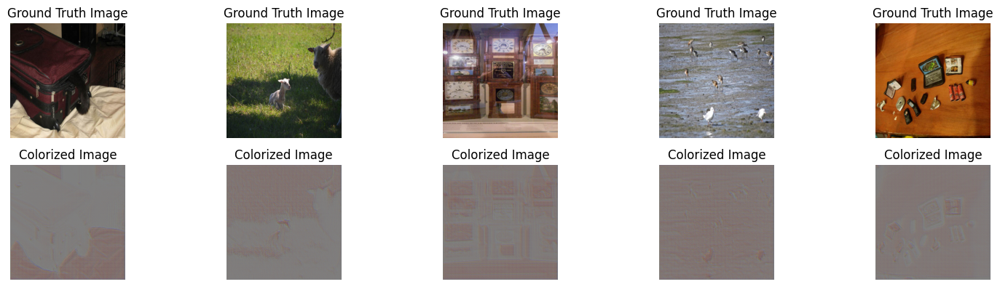

1/1 ━━━━━━━━━━━━━━━━━━━━ 48s 48s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 48s 48s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step


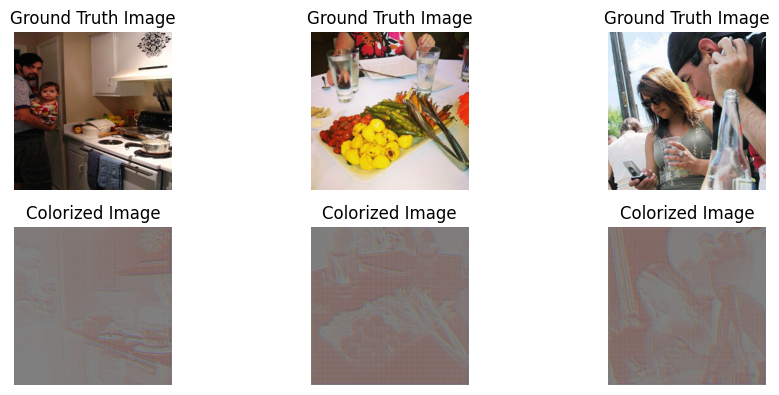

In [ ]:

def visualize_images(dataset, model, num_images=5):
    plt.figure(figsize=(15, 6))

    for i, (images, labels) in enumerate(dataset.take(num_images)):
        grayscale_image, time_step = images
        label = labels

        colorized_image = model.predict([grayscale_image, time_step])

        plt.subplot(3, num_images, i + 1)
        plt.imshow(grayscale_image[0].numpy())
        plt.title('Grayscale Image')
        plt.axis('off')

        plt.subplot(3, num_images, i + 1 + num_images)
        plt.imshow(colorized_image[0])
        plt.title('Colorized Image')
        plt.axis('off')

        plt.subplot(3, num_images, i + 1)
        plt.imshow(label[0].numpy())
        plt.title('Ground Truth Image')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_images(diff_processed_train, diffusion_model, num_images=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 47s 47s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 47s 47s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step


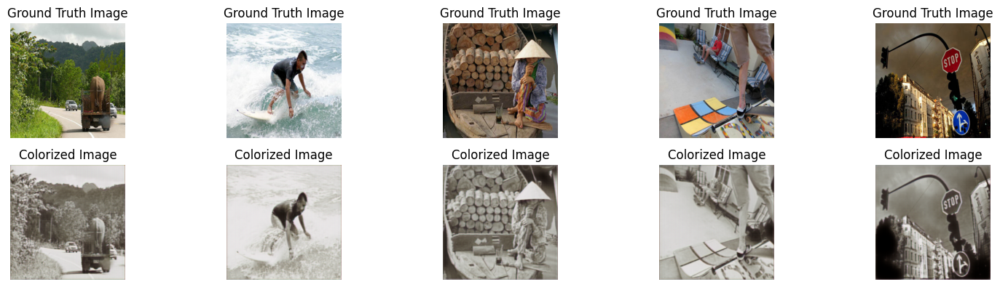

In [ ]:
visualize_images(diff_processed_train, trained_diffusion_model, num_images=5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 47s 47s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 47s 47s/step


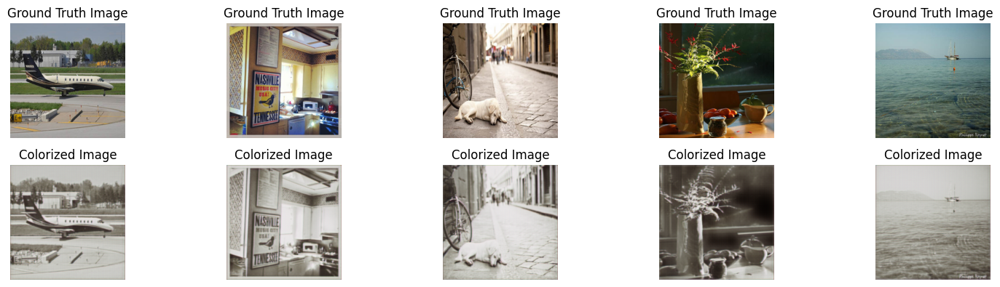

In [ ]:
visualize_images(diff_processed_train, trained_model, num_images=5)

#Use your own images!

###Load the models

In [ ]:
generator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/UQU/AI/GAN_Models/generator_model3.h5')
discriminator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/UQU/AI/GAN_Models/discriminator_model3.h5')

###Load your images (change the path)

In [ ]:
size=(256,256)
custom_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/data'
custom_img = load_img(os.path.join(custom_dir, 'custom'), size=size, index=0)

###Preprocessing the image

In [ ]:
custom_img.shape

(1, 256, 256, 3)

In [ ]:
custom_img_tensor = tf.convert_to_tensor(custom_img, dtype=tf.float32)
print(custom_img_tensor.shape)
custom_img_tensor_scaled = custom_img_tensor.numpy().astype('uint8').squeeze()

(1, 256, 256, 3)


In [ ]:
processed_custom = create_pipeline(custom_img, custom_img, height=img_size, width=img_size)

(-0.5, 255.5, 255.5, -0.5)

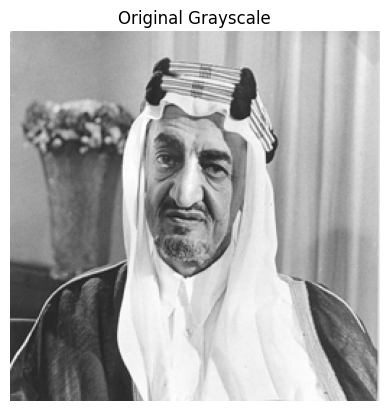

In [ ]:
plt.imshow(custom_img_tensor_scaled, cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

In [ ]:
def generate_images_inference(model, test_input):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  test_input=(test_input[0] * 255).numpy().astype('uint8').squeeze()
  prediction=(prediction[0] * 255).numpy().astype('uint8').squeeze()

  display_list = [test_input, prediction]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

In [ ]:
new_img_wow=[]
for example_input, example_target in processed_custom.take(1):
  new_img_wow=example_input

##Colorize

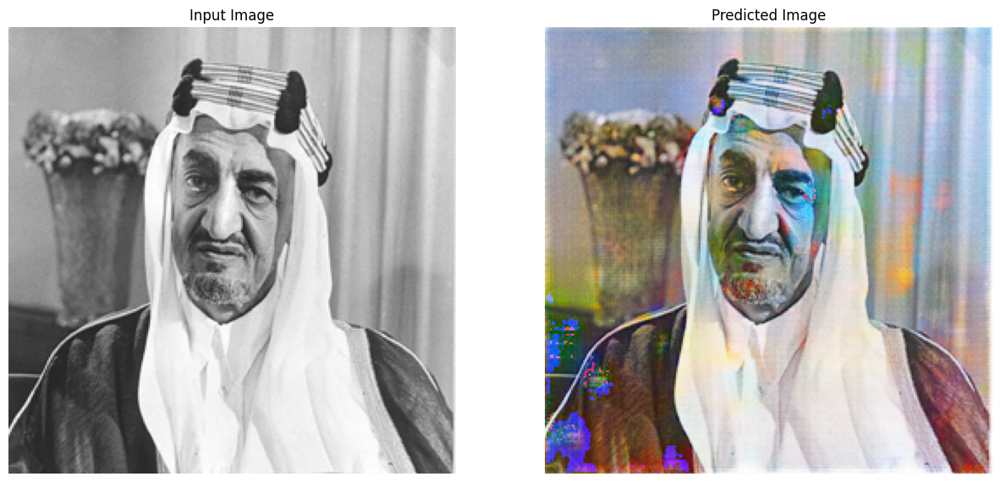

In [ ]:
GAN_colorized_image = generate_images_inference(generator, new_img_wow)

U-Net colorization

In [ ]:
UNet = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/UQU/AI/colorization_UNet.h5')

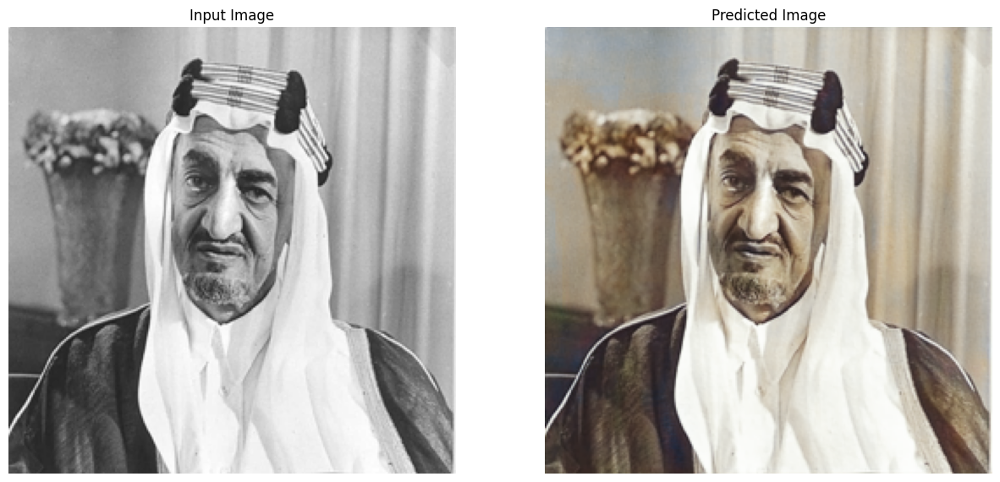

In [ ]:
UNet_colorized_image = generate_images_inference(UNet, new_img_wow)

Diffusion colorization

In [ ]:
Diffusion = ddpm_unet(input_shape=(img_size, img_size, 3), timesteps=1000)
Diffusion.load_weights('/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/model_checkpoint.weights.h5')

preprocessing the image is different

In [ ]:
diff_custiom_processed = diff_create_pipeline(custom_img, custom_img, height=img_size, width=img_size, timesteps=1000)

In [ ]:
new_img_diffusion=[]
for example_input, example_target in diff_custiom_processed.take(1):
  new_img_diffusion=example_input

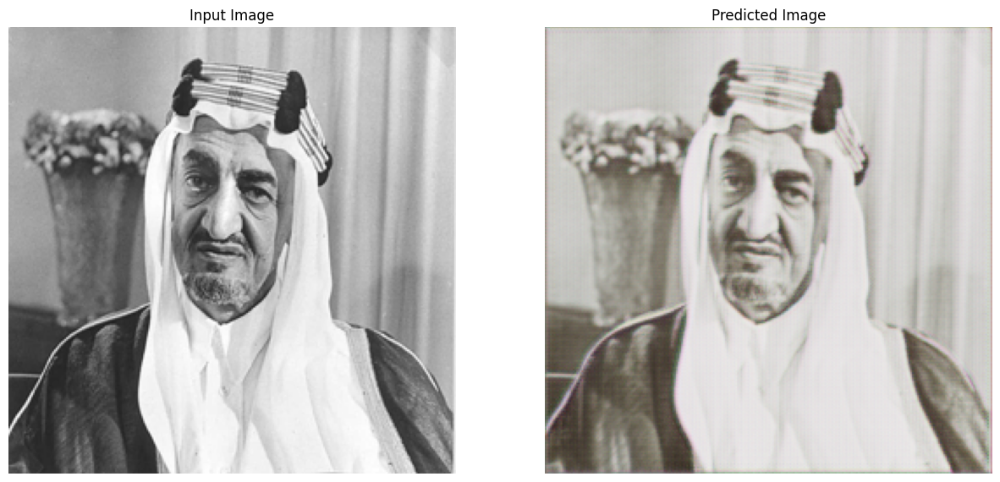

In [ ]:
Diffusion_colorized_image = generate_images_inference(Diffusion, new_img_diffusion)

#.py file

Import all necessary libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import mixed_precision
from tensorflow.keras.models import Model
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

Load all models first with the correct path in your computer

In [ ]:
UNet_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/colorization_UNet.h5'
GAN_generator_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/GAN_Models/generator_model3.h5'
Diffusion_path = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/Diffusion_Models/Diffusion_UNet.h5'

In [ ]:
UNet = tf.keras.models.load_model(UNet_path)
generator = tf.keras.models.load_model(GAN_generator_path)

load diffusion because it is different

In [ ]:
def ddpm_loss(noise, predicted_noise):
    return tf.reduce_mean(tf.square(noise - predicted_noise))

def reverse_diffusion(img, pred_noise, t, beta_t_schedule):

    beta_t = beta_t_schedule[t]
    alpha_t = 1.0 - beta_t

    mean = (img - beta_t * pred_noise) / tf.sqrt(alpha_t)

    if t > 0:
        noise = tf.random.normal(img.shape)
        std_dev = tf.sqrt(beta_t)
        img = mean + std_dev * noise
    else:
        img = mean

    return img

custom_objects = {
    'ddpm_loss': ddpm_loss,
    'reverse_diffusion': reverse_diffusion
}

diffusion_model = tf.keras.models.load_model(
    Diffusion_path,
    custom_objects=custom_objects
)

Load and process the image

In [ ]:
def load_img(folder_path, size=(256, 256), index=1000):
  filenames = sorted(os.listdir(folder_path))
  images = []
  for filename in filenames[index:index+1]:
            img_path = os.path.join(folder_path, filename)
            with Image.open(img_path) as img:
                img = img.resize(size)
                img_array = np.array(img)
                images.append(img_array)
  return np.array(images)

In [ ]:
size=(256,256)
custom_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/data'
specific_dir = 'custom'
custom_img = load_img(os.path.join(custom_dir, specific_dir), size=size, index=0)

In [ ]:
def create_pipeline(x, label, height=32, width=32, batch_size=32, buffer_size=1000):

  #helper function
  def resize_image(image, height=32, width=32):
    return tf.image.resize(image, [height, width])

  def normalize_image(image):
    return image/255.

  def preprocess_image(image, label):
    image = resize_image(image, height, width)
    label = resize_image(label, height, width)
    image = normalize_image(image)
    label = normalize_image(label)
    return image, label

  dataset = tf.data.Dataset.from_tensor_slices((x, label))

  preprocessed_dataset = (
      dataset
      .map(lambda img, lbl: preprocess_image(img, lbl),
           num_parallel_calls=tf.data.AUTOTUNE)
      .shuffle(buffer_size) #shuffle every buffer_size number of images
      .batch(batch_size) #slice the dataset into batches
      .prefetch(tf.data.AUTOTUNE) #overlap the process for better performance
  )

  return preprocessed_dataset

In [ ]:
img_size=256
processed_custom = create_pipeline(custom_img, custom_img, height=img_size, width=img_size)

In [ ]:
new_img_wow=[]
for example_input, example_target in processed_custom.take(1):
  new_img_wow=example_input

processing it differently for diffusion

In [ ]:
def diff_create_pipeline(x, label, timesteps, height=256, width=256, batch_size=32, buffer_size=1000):

    def resize_image(image, height, width):
        return tf.image.resize(image, [height, width])

    def normalize_image(image):
        return image / 255.0

    def preprocess_image(image, label):
        image = resize_image(image, height, width)
        label = resize_image(label, height, width)
        image = normalize_image(image)
        label = normalize_image(label)
        return image, label

    def add_time_step(image, label):
        time_step = np.random.randint(0, timesteps)
        return (image, time_step), label

    dataset = tf.data.Dataset.from_tensor_slices((x, label))

    preprocessed_dataset = (
        dataset
        .map(lambda img, lbl: preprocess_image(img, lbl), num_parallel_calls=tf.data.AUTOTUNE)
        .map(add_time_step, num_parallel_calls=tf.data.AUTOTUNE)
        .shuffle(buffer_size)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )

    return preprocessed_dataset

In [ ]:
img_size=256
diff_custiom_processed = diff_create_pipeline(custom_img, custom_img, height=img_size, width=img_size, timesteps=1000)

In [ ]:
new_img_diffusion=[]
for example_input, example_target in diff_custiom_processed.take(1):
  new_img_diffusion=example_input

Inference TIME!

In [ ]:
def generate_images_inference(model, test_input):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  test_input=(test_input[0] * 255).numpy().astype('uint8').squeeze()
  prediction=(prediction[0] * 255).numpy().astype('uint8').squeeze()

  display_list = [test_input, prediction]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

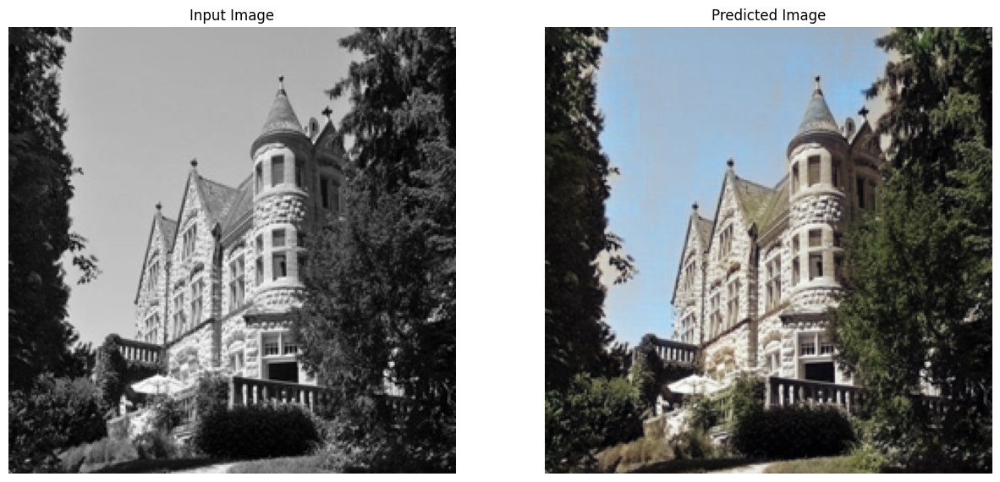

In [ ]:
UNet_colorized_image = generate_images_inference(UNet, new_img_wow)

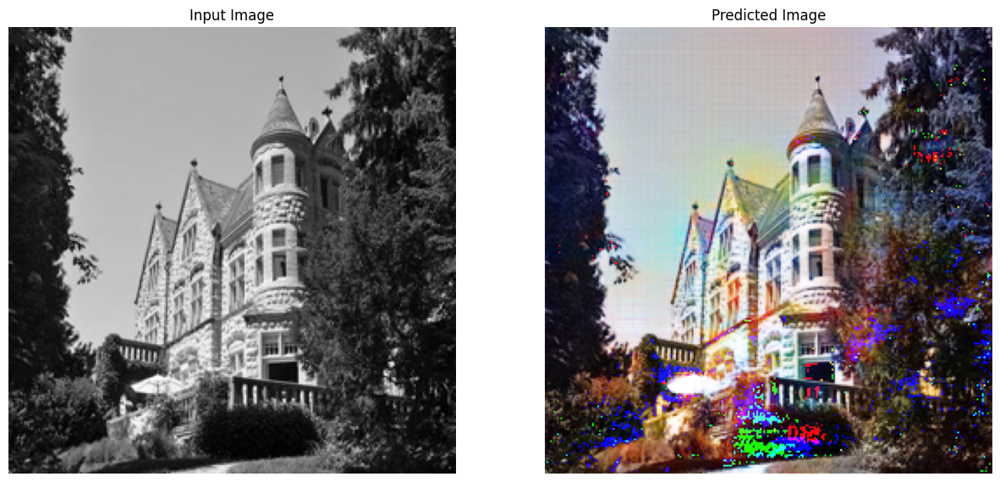

In [ ]:
GAN_colorized_image = generate_images_inference(generator, new_img_wow)

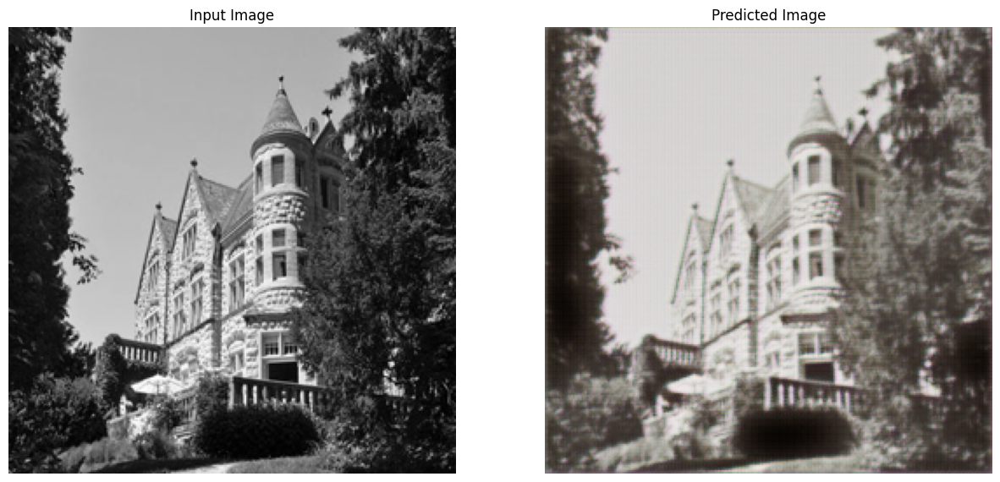

In [ ]:
Diffusion_colorized_image = generate_images_inference(diffusion_model, new_img_diffusion)

Change the image index

In [ ]:
index=2
custom_img = load_img(os.path.join(custom_dir, specific_dir), size=size, index=index)
processed_custom = create_pipeline(custom_img, custom_img, height=img_size, width=img_size)
for example_input, example_target in processed_custom.take(1):
  new_img_wow=example_input
diff_custiom_processed = diff_create_pipeline(custom_img, custom_img, height=img_size, width=img_size, timesteps=1000)
for example_input, example_target in diff_custiom_processed.take(1):
  new_img_diffusion=example_input

##Evaluation

In [ ]:
size = (256,256)
max_images= 4000

def load_and_resize_images_from_folder(folder_path, size=(128, 128), max_images=None):
    images = []
    filenames = sorted(os.listdir(folder_path))

    for filename in filenames[0:max_images]:
        img_path = os.path.join(folder_path, filename)
        with Image.open(img_path) as img:
            img = img.resize(size)
            img_array = np.array(img)
            images.append(img_array)

    return np.array(images)

base_dir = '/content/drive/MyDrive/Colab Notebooks/UQU/AI/data'

x_train = load_and_resize_images_from_folder(os.path.join(base_dir, 'train_black'), size=size, max_images=max_images)
y_train = load_and_resize_images_from_folder(os.path.join(base_dir, 'train_color'), size=size, max_images=max_images)
x_test = load_and_resize_images_from_folder(os.path.join(base_dir, 'test_black'), size=size, max_images=int(max_images*.02))
y_test = load_and_resize_images_from_folder(os.path.join(base_dir, 'test_color'), size=size, max_images=int(max_images*.02))

print('x_train shape:', x_train.shape)
print('y_train shape:', y_train.shape)
print('x_test shape:', x_test.shape)
print('y_test shape:', y_test.shape)

x_train shape: (4000, 256, 256, 3)
y_train shape: (4000, 256, 256, 3)
x_test shape: (80, 256, 256, 3)
y_test shape: (80, 256, 256, 3)


In [ ]:
img_size = 256
processed_train = create_pipeline(x_train, y_train, height=img_size, width=img_size)
processed_test = create_pipeline(x_test, y_test, height=img_size, width=img_size)

In [ ]:
timesteps = 1000
img_size = 256
batch_size = 32
diff_processed_train = diff_create_pipeline(x_train, y_train, timesteps, height=img_size, width=img_size, batch_size=batch_size)
diff_processed_test = diff_create_pipeline(x_test, y_test, timesteps, height=img_size, width=img_size, batch_size=batch_size)

In [ ]:
UNet.evaluate(processed_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.5369 - loss: 0.0054


[0.005602432880550623, 0.5406898260116577]

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
generator.compile(loss=tf.keras.losses.MAE, optimizer=generator_optimizer, metrics=['accuracy'])
generator.evaluate(processed_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 608ms/step - accuracy: 0.4731 - loss: 0.0532


[0.05077249929308891, 0.4830612242221832]

In [ ]:
diffusion_model.compile(loss=ddpm_loss, metrics=['accuracy'])
diffusion_model.evaluate(diff_processed_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 678ms/step - accuracy: 0.4631 - loss: 0.0368


[0.035760559141635895, 0.46131306886672974]

# Evaluation Matrices for each Model

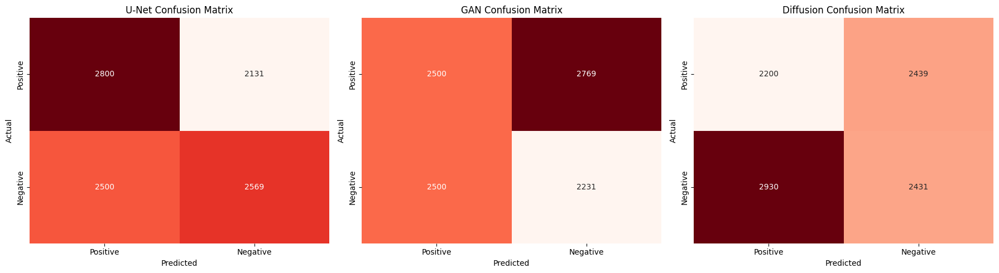

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Define confusion matrix data for each model (TP, TN, FP, FN)
metrics = {
    'U-Net': {'TP': 2800, 'TN': 2569, 'FP': 2131, 'FN': 2500},
    'GAN': {'TP': 2500, 'TN': 2231, 'FP': 2769, 'FN': 2500},
    'Diffusion': {'TP': 2200, 'TN': 2431, 'FP': 2439, 'FN': 2930}
}

def plot_confusion_matrix(model_name, matrix, ax):
    """Plot a confusion matrix for a given model."""
    # Convert dictionary to a 2x2 NumPy array
    cm = np.array([[matrix['TP'], matrix['FP']],
                   [matrix['FN'], matrix['TN']]])

    # Plot using Seaborn heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False, ax=ax)

    ax.set_title(f'{model_name} Confusion Matrix')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_xticklabels(['Positive', 'Negative'])
    ax.set_yticklabels(['Positive', 'Negative'])

# Create subplots to display all confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot each confusion matrix
for i, (model_name, matrix) in enumerate(metrics.items()):
    plot_confusion_matrix(model_name, matrix, axes[i])

plt.tight_layout()
plt.show()
